Some of the features that are available in the Perth Housing Dataset.

ADDRESS : Physical address of the property ( we will set to index )
SUBURB : Specific locality in Perth; a list of all Perth suburb can be found here
PRICE : Price at which a property was sold (AUD)
BEDROOMS : Number of bedrooms
BATHROOMS : Number of bathrooms
GARAGE : Number of garage places
LAND_AREA : Total land area (m^2)
FLOOR_AREA : Internal floor area (m^2)
BUILD_YEAR : Year in which the property was built
CBD_DIST : Distance from the centre of Perth (m)
NEAREST_STN : The nearest public transport station from the property
NEAREST_STN_DIST : The nearest station distance (m)
DATE_SOLD : Month & year in which the property was sold
POSTCODE : Local Area Identifier
LATITUDE : Geographic Location (lat) of ADDRESS
LONGITIDE : Geographic Location (long) of ADDRESS
NEAREST_SCH : Location of the nearest School
NEAREST_SCH_DIST : Distance to the nearest school
NEAREST_SCH_RANK : Ranking of the nearest school

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats

In [2]:
df = pd.read_csv(r'C:\Users\Thanh\OneDrive\Documents\MBA\Machine Learning Class\midterm project\all_perth_310121.csv')
#lowercase all columns


In [3]:
missing_values = df.isnull().sum()
print(missing_values)

ADDRESS                 0
SUBURB                  0
PRICE                   0
BEDROOMS                0
BATHROOMS               0
GARAGE               2478
LAND_AREA               0
FLOOR_AREA              0
BUILD_YEAR           3155
CBD_DIST                0
NEAREST_STN             0
NEAREST_STN_DIST        0
DATE_SOLD               0
POSTCODE                0
LATITUDE                0
LONGITUDE               0
NEAREST_SCH             0
NEAREST_SCH_DIST        0
NEAREST_SCH_RANK    10952
dtype: int64


In [4]:
df.columns = map(str.lower, df.columns)
#remove "/r" in date_sold column
df['date_sold'] = df['date_sold'].str.replace('\r', '') 

#convert build_year to year with 0 decimal places
df['build_year'] = pd.to_datetime(df['build_year'], format='%Y').dt.year

#deal with missing values in build_year column using mean

df['build_year'] = df['build_year'].fillna(df['build_year'].median()).round(0)

#deal with missing values in garage column using mean (whole numbers
df['garage'] = df['garage'].fillna(df['garage'].mean()).round(0)

# Some Data Cleaning 
df.drop_duplicates(subset=['address'],inplace=True) # Some addresses actually have multiple entries



In [5]:
missing_values = df.isnull().sum()
print(missing_values)

address                 0
suburb                  0
price                   0
bedrooms                0
bathrooms               0
garage                  0
land_area               0
floor_area              0
build_year              0
cbd_dist                0
nearest_stn             0
nearest_stn_dist        0
date_sold               0
postcode                0
latitude                0
longitude               0
nearest_sch             0
nearest_sch_dist        0
nearest_sch_rank    10938
dtype: int64


In [6]:
df

,address,suburb,price,bedrooms,bathrooms,garage,land_area,floor_area,build_year,cbd_dist,nearest_stn,nearest_stn_dist,date_sold,postcode,latitude,longitude,nearest_sch,nearest_sch_dist,nearest_sch_rank
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,9C Gold Street,South Fremantle,1040000,4,3,2.0,292,245,2013.0,16100,Fremantle Station,1500,03-2016,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,49.0
33652,9C Pycombe Way,Westminster,410000,3,2,2.0,228,114,1995.0,9600,Stirling Station,4600,02-2017,6061,-31.867055,115.841403,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.679644,35.0
33653,9D Pycombe Way,Westminster,427000,3,2,2.0,261,112,1995.0,9600,Stirling Station,4600,02-2017,6061,-31.866890,115.841418,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.669159,35.0
33654,9D Shalford Way,Girrawheen,295000,3,1,2.0,457,85,1974.0,12600,Warwick Station,4400,10-2016,6064,-31.839680,115.842410,GIRRAWHEEN SENIOR HIGH SCHOOL,0.358494,NaN


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33566 entries, 0 to 33655
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   address           33566 non-null  object 
 1   suburb            33566 non-null  object 
 2   price             33566 non-null  int64  
 3   bedrooms          33566 non-null  int64  
 4   bathrooms         33566 non-null  int64  
 5   garage            33566 non-null  float64
 6   land_area         33566 non-null  int64  
 7   floor_area        33566 non-null  int64  
 8   build_year        33566 non-null  float64
 9   cbd_dist          33566 non-null  int64  
 10  nearest_stn       33566 non-null  object 
 11  nearest_stn_dist  33566 non-null  int64  
 12  date_sold         33566 non-null  object 
 13  postcode          33566 non-null  int64  
 14  latitude          33566 non-null  float64
 15  longitude         33566 non-null  float64
 16  nearest_sch       33566 non-null  object

In [8]:
df

,address,suburb,price,bedrooms,bathrooms,garage,land_area,floor_area,build_year,cbd_dist,nearest_stn,nearest_stn_dist,date_sold,postcode,latitude,longitude,nearest_sch,nearest_sch_dist,nearest_sch_rank
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,9C Gold Street,South Fremantle,1040000,4,3,2.0,292,245,2013.0,16100,Fremantle Station,1500,03-2016,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,49.0
33652,9C Pycombe Way,Westminster,410000,3,2,2.0,228,114,1995.0,9600,Stirling Station,4600,02-2017,6061,-31.867055,115.841403,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.679644,35.0
33653,9D Pycombe Way,Westminster,427000,3,2,2.0,261,112,1995.0,9600,Stirling Station,4600,02-2017,6061,-31.866890,115.841418,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.669159,35.0
33654,9D Shalford Way,Girrawheen,295000,3,1,2.0,457,85,1974.0,12600,Warwick Station,4400,10-2016,6064,-31.839680,115.842410,GIRRAWHEEN SENIOR HIGH SCHOOL,0.358494,NaN


In [9]:
df2 = df.drop(['nearest_sch_rank'], axis=1)

In [10]:
#check for NAs
df2.isna().sum()


address             0
suburb              0
price               0
bedrooms            0
bathrooms           0
garage              0
land_area           0
floor_area          0
build_year          0
cbd_dist            0
nearest_stn         0
nearest_stn_dist    0
date_sold           0
postcode            0
latitude            0
longitude           0
nearest_sch         0
nearest_sch_dist    0
dtype: int64

In [11]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33566 entries, 0 to 33655
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   address           33566 non-null  object 
 1   suburb            33566 non-null  object 
 2   price             33566 non-null  int64  
 3   bedrooms          33566 non-null  int64  
 4   bathrooms         33566 non-null  int64  
 5   garage            33566 non-null  float64
 6   land_area         33566 non-null  int64  
 7   floor_area        33566 non-null  int64  
 8   build_year        33566 non-null  float64
 9   cbd_dist          33566 non-null  int64  
 10  nearest_stn       33566 non-null  object 
 11  nearest_stn_dist  33566 non-null  int64  
 12  date_sold         33566 non-null  object 
 13  postcode          33566 non-null  int64  
 14  latitude          33566 non-null  float64
 15  longitude         33566 non-null  float64
 16  nearest_sch       33566 non-null  object

Text(0.5, 1.0, 'Correlation Heatmap of Perth Housing Price')

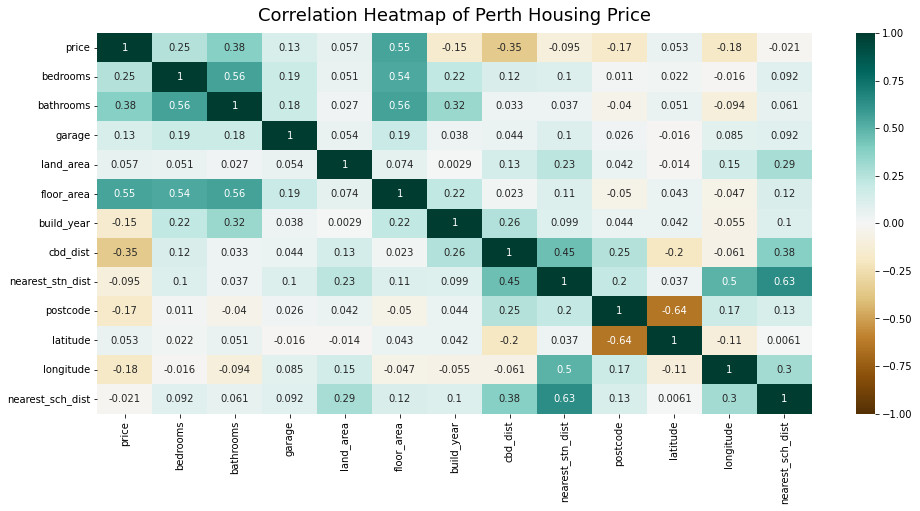

In [12]:
#create a correlation matrix from -1 to 1 using seaborn
plt.figure(figsize=(16, 7))
df_heatmap = sns.heatmap(df2.corr(),vmin=-1, vmax=1, annot=True,cmap='BrBG')
df_heatmap.set_title('Correlation Heatmap of Perth Housing Price', fontdict={'fontsize':18}, pad=12)

Text(0.5, 1.0, 'Features Correlating with Price')

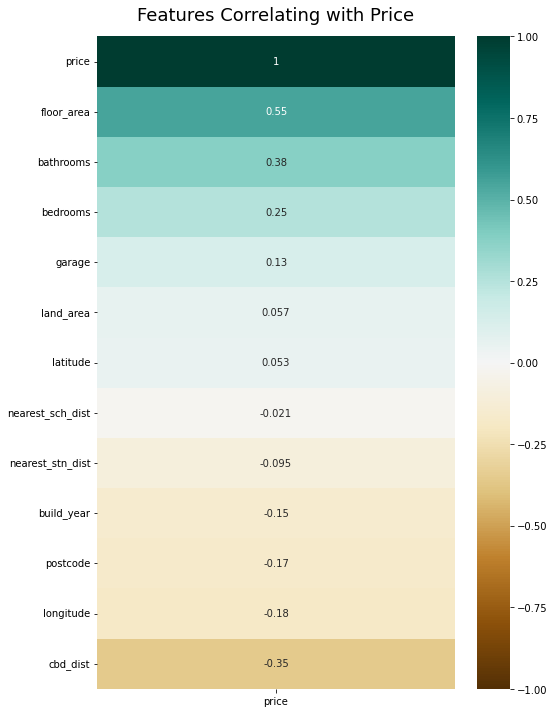

In [13]:
Price = df2.corr()[['price']].sort_values(by='price', ascending=False)
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(Price, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with Price', fontdict={'fontsize':18}, pad=16)

array([[<AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>,
        <AxesSubplot:title={'center':'garage'}>],
       [<AxesSubplot:title={'center':'land_area'}>,
        <AxesSubplot:title={'center':'floor_area'}>,
        <AxesSubplot:title={'center':'build_year'}>,
        <AxesSubplot:title={'center':'cbd_dist'}>],
       [<AxesSubplot:title={'center':'nearest_stn_dist'}>,
        <AxesSubplot:title={'center':'postcode'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'longitude'}>],
       [<AxesSubplot:title={'center':'nearest_sch_dist'}>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

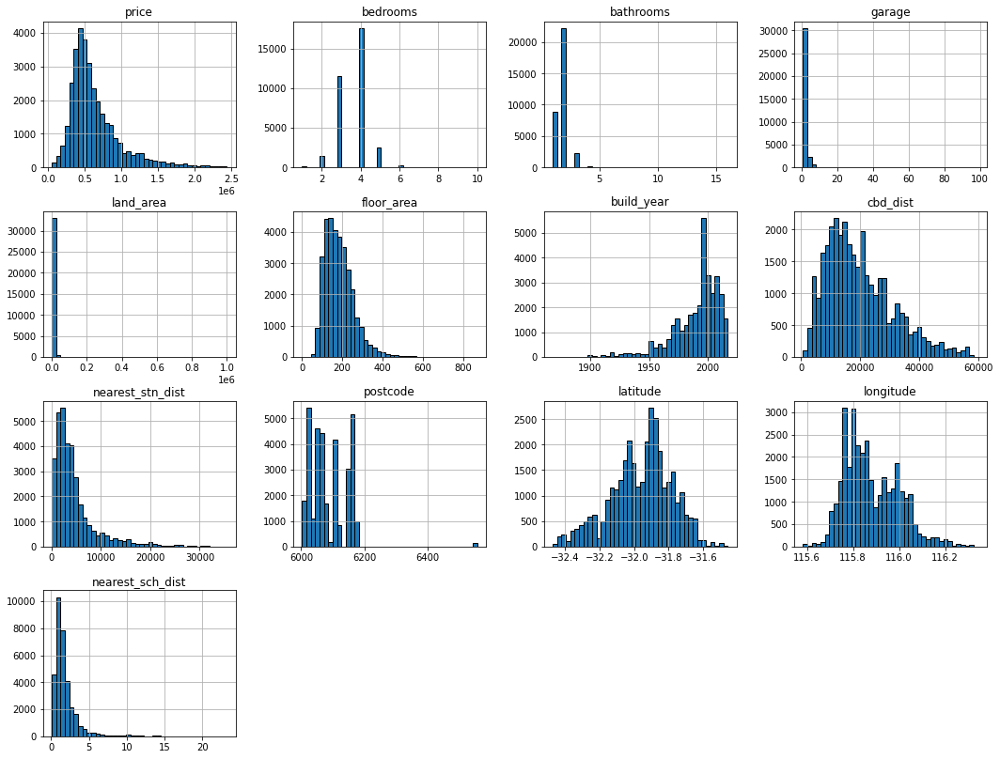

In [14]:
num_cols = list(df2.select_dtypes(['int64', 'float64']))
df2[num_cols].hist(bins=40, figsize=(18,14), edgecolor='black')

Text(0, 0.5, 'Price')

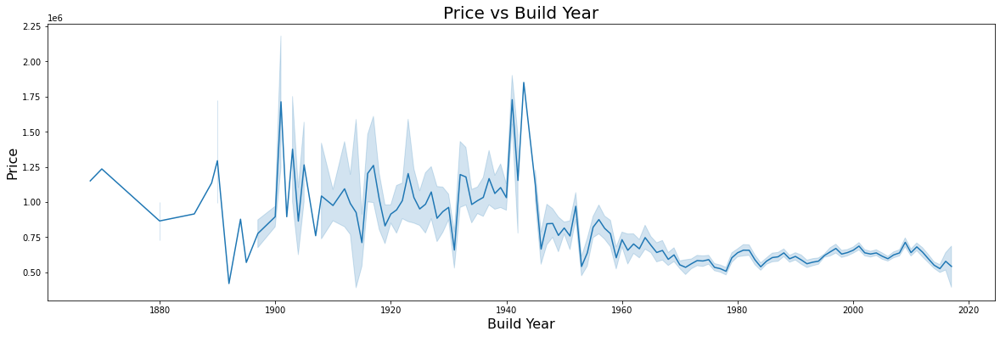

In [15]:
#visualize how PRICE responds to BUILD_YEAR.
plt.figure(figsize=(20,6))
fig = sns.lineplot(x=df2['build_year'], y=df2['price'])
fig.set_title('Price vs Build Year', fontsize=20)
fig.set_xlabel('Build Year', fontsize=16)
fig.set_ylabel('Price', fontsize=16)


In [16]:
top_postcodes = df['postcode'].value_counts().head(10)
print(top_postcodes)

6056    1812
6065    1539
6164    1270
6112    1256
6167     973
6055     945
6030     933
6027     876
6163     852
6107     780
Name: postcode, dtype: int64


In [17]:
from urllib.request import urlopen
import json


#json file for australia map
with urlopen('https://raw.githubusercontent.com/tonywr71/GeoJson-Data/master/australian-states.json') as response:
    australia = json.load(response)

info = geo_df = df2[['latitude', 'longitude', 'price', 'build_year', 'suburb']]

fig = px.scatter_mapbox(info, lat='latitude', lon='longitude', hover_name='suburb', 
    hover_data=['build_year'], color='price',
    zoom=8, height=500, width=1150)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":1,"l":1,"b":1})
fig.show()

In [18]:

df_filtered = df2[df2['price'] <= 1000000]

# Create a new dataframe containing only the columns needed for the map
info = df_filtered[['latitude', 'longitude', 'price', 'address', 'build_year']]

# Create the scatter map using Plotly Express and Mapbox API
fig = px.scatter_mapbox(info, lat='latitude', lon='longitude', hover_name='address', 
    hover_data=['build_year'], color='price',
    zoom=8, height=500, width=1150)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":1,"l":1,"b":1})
fig.show()

In [19]:
# Assuming df is the dataframe containing the data
median_price = df2['price'].median()

df_filtered = df2[df2['price'] <= median_price]

# Create a new dataframe containing only the columns needed for the map
info = df_filtered[['latitude', 'longitude', 'price', 'suburb', 'build_year']]

# Create the scatter map using Plotly Express and Mapbox API
fig = px.scatter_mapbox(info, lat='latitude', lon='longitude', hover_name='suburb', 
    hover_data=['build_year'], color='price',
    zoom=8, height=500, width=1150)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":1,"l":1,"b":1})
fig.show()

Text(0, 0.5, 'Frequency')

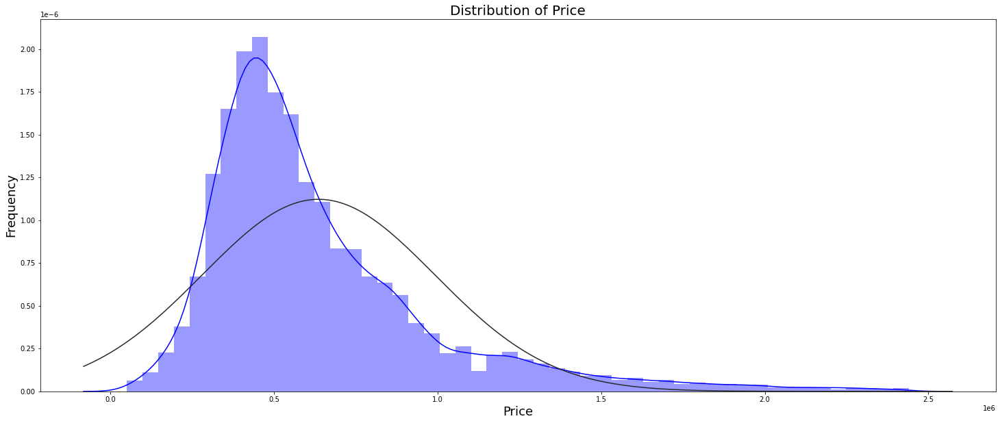

In [20]:
#graph and see the distribution of price
plt.figure(figsize=(25, 10))
sns.distplot(df2['price'], color='blue', fit=norm)
plt.title('Distribution of Price', fontsize=20)
plt.xlabel('Price', fontsize=18)
plt.ylabel('Frequency', fontsize=18)



In [21]:
df2

,address,suburb,price,bedrooms,bathrooms,garage,land_area,floor_area,build_year,cbd_dist,nearest_stn,nearest_stn_dist,date_sold,postcode,latitude,longitude,nearest_sch,nearest_sch_dist
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,9C Gold Street,South Fremantle,1040000,4,3,2.0,292,245,2013.0,16100,Fremantle Station,1500,03-2016,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350
33652,9C Pycombe Way,Westminster,410000,3,2,2.0,228,114,1995.0,9600,Stirling Station,4600,02-2017,6061,-31.867055,115.841403,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.679644
33653,9D Pycombe Way,Westminster,427000,3,2,2.0,261,112,1995.0,9600,Stirling Station,4600,02-2017,6061,-31.866890,115.841418,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.669159
33654,9D Shalford Way,Girrawheen,295000,3,1,2.0,457,85,1974.0,12600,Warwick Station,4400,10-2016,6064,-31.839680,115.842410,GIRRAWHEEN SENIOR HIGH SCHOOL,0.358494


In [22]:
df2

,address,suburb,price,bedrooms,bathrooms,garage,land_area,floor_area,build_year,cbd_dist,nearest_stn,nearest_stn_dist,date_sold,postcode,latitude,longitude,nearest_sch,nearest_sch_dist
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,9C Gold Street,South Fremantle,1040000,4,3,2.0,292,245,2013.0,16100,Fremantle Station,1500,03-2016,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350
33652,9C Pycombe Way,Westminster,410000,3,2,2.0,228,114,1995.0,9600,Stirling Station,4600,02-2017,6061,-31.867055,115.841403,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.679644
33653,9D Pycombe Way,Westminster,427000,3,2,2.0,261,112,1995.0,9600,Stirling Station,4600,02-2017,6061,-31.866890,115.841418,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.669159
33654,9D Shalford Way,Girrawheen,295000,3,1,2.0,457,85,1974.0,12600,Warwick Station,4400,10-2016,6064,-31.839680,115.842410,GIRRAWHEEN SENIOR HIGH SCHOOL,0.358494


Text(0, 0.5, 'Frequency')

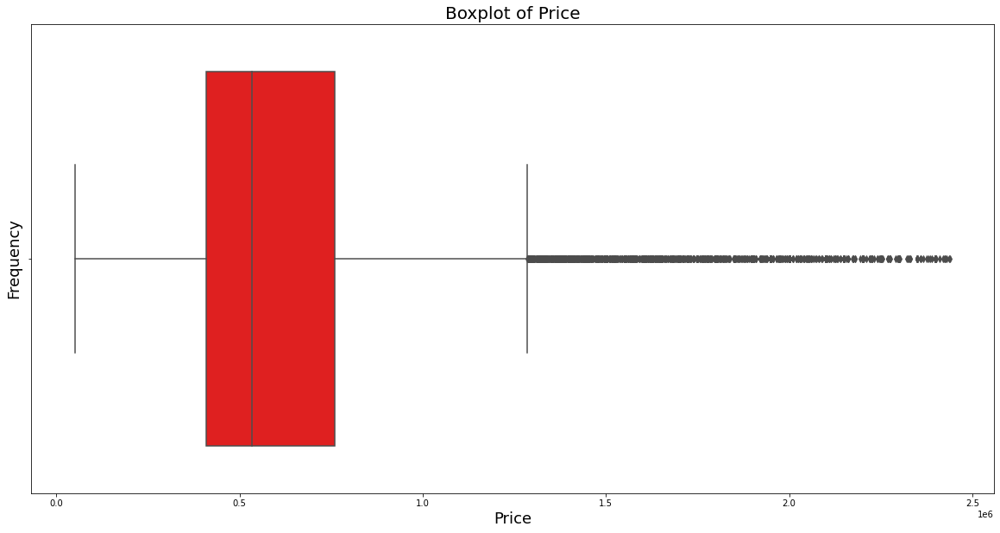

In [23]:

#boxplot of price
plt.figure(figsize=(20, 10))
sns.boxplot(df2['price'], color='red')
plt.title('Boxplot of Price', fontsize=20)
plt.xlabel('Price', fontsize=18)
plt.ylabel('Frequency', fontsize=18)

Text(0, 0.5, 'Frequency')

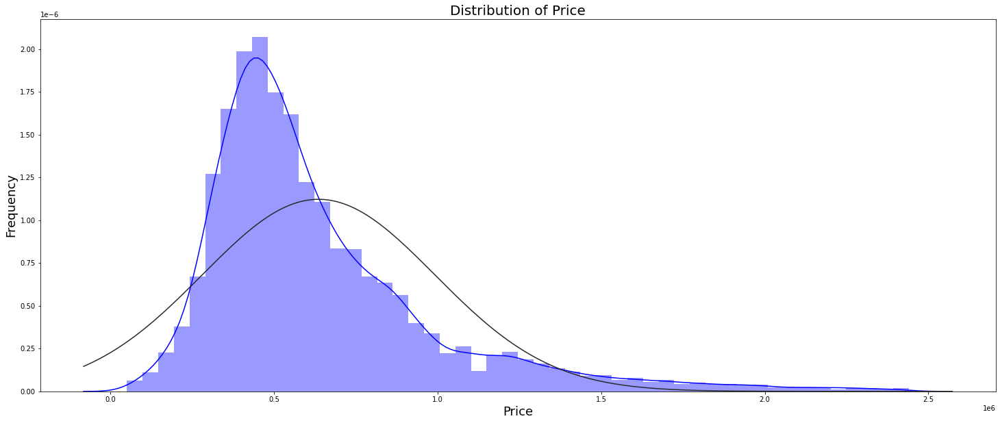

In [24]:
#graph and see the distribution of price
plt.figure(figsize=(25, 10))
sns.distplot(df2['price'], color='blue',fit=norm)
plt.title('Distribution of Price', fontsize=20)
plt.xlabel('Price', fontsize=18)
plt.ylabel('Frequency', fontsize=18)

In [25]:
#normality test
from scipy.stats import shapiro
stat, p = shapiro(df2['price'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')


Statistics=0.846, p=0.000
Sample does not look Gaussian (reject H0)


In [26]:
df2.describe()

,price,bedrooms,bathrooms,garage,land_area,floor_area,build_year,cbd_dist,nearest_stn_dist,postcode,latitude,longitude,nearest_sch_dist
count,3.356600e+04,33566.000000,33566.000000,33566.000000,33566.000000,33566.000000,33566.000000,33566.000000,33566.000000,33566.000000,33566.000000,33566.000000,33566.000000
mean,6.364845e+05,3.659358,1.822708,2.185396,2742.353066,183.467646,1990.227999,19786.939612,4524.564559,6089.439343,-31.960636,115.879283,1.815196
std,3.555393e+05,0.751325,0.586809,1.315995,16714.065459,72.042500,19.986875,11362.589123,4495.208049,62.129043,0.177856,0.118135,1.745901
min,5.100000e+04,1.000000,1.000000,1.000000,61.000000,1.000000,1868.000000,681.000000,46.000000,6003.000000,-32.472979,115.582730,0.070912
25%,4.100000e+05,3.000000,1.000000,2.000000,504.000000,130.000000,1980.000000,11200.000000,1800.000000,6050.000000,-32.068787,115.789873,0.880703
50%,5.350000e+05,4.000000,2.000000,2.000000,682.000000,172.000000,1995.000000,17500.000000,3200.000000,6069.000000,-31.933152,115.854217,1.345520
75%,7.600000e+05,4.000000,2.000000,2.000000,837.000000,222.000000,2004.000000,26600.000000,5300.000000,6150.000000,-31.843585,115.970708,2.097155
max,2.440000e+06,10.000000,16.000000,99.000000,999999.000000,870.000000,2017.000000,59800.000000,35500.000000,6558.000000,-31.457450,116.343201,23.254372


Text(0, 0.5, '# of Houses')

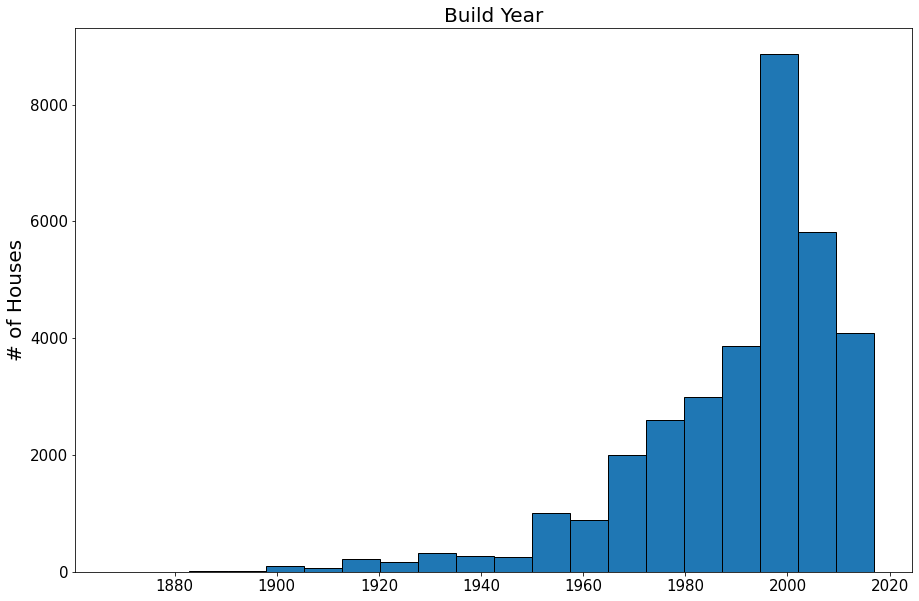

In [27]:
df2["build_year"].plot(kind="hist", edgecolor='black', title="Build Year", figsize=(15,10), bins=20, fontsize=15)
plt.title('Build Year', fontsize=20)
plt.ylabel('# of Houses', fontsize=20)

In [28]:
#seperate the date_sold column into month and year
df2['date_sold'] = pd.to_datetime(df2['date_sold'])

df2['month_sold'] = df2['date_sold'].dt.month
df2['year_sold'] = df2['date_sold'].dt.year

df2.drop(['date_sold'], axis=1, inplace=True)




In [29]:
corr_matrix = df2.corr()
corr_matrix['price'].sort_values(ascending=False)

price               1.000000
floor_area          0.549193
bathrooms           0.376878
bedrooms            0.253455
garage              0.130609
year_sold           0.074120
land_area           0.057038
latitude            0.052597
month_sold          0.004612
nearest_sch_dist   -0.021411
nearest_stn_dist   -0.094700
build_year         -0.150906
postcode           -0.170553
longitude          -0.183160
cbd_dist           -0.353720
Name: price, dtype: float64

Text(0, 0.5, '# of Houses')

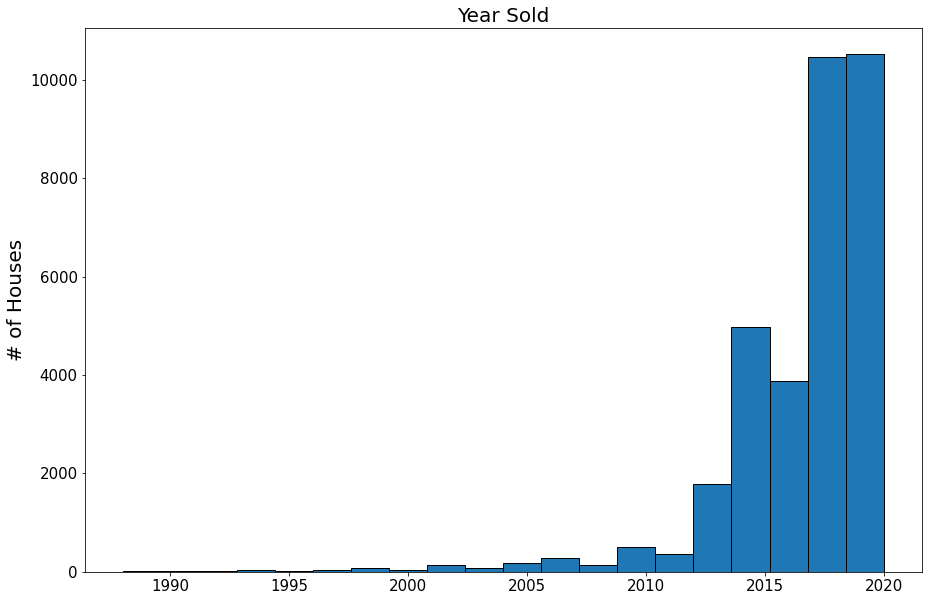

In [30]:
df2["year_sold"].plot(kind="hist", edgecolor='black', title="Year Sold", figsize=(15,10), bins=20, fontsize=15)
plt.title('Year Sold', fontsize=20)
plt.ylabel('# of Houses', fontsize=20)


In [31]:
#houses in top 10 suburb based on price range low to high
top_suburbs=df2.groupby('suburb')['price'].mean().sort_values(ascending=False).head(10).round(0)
top_suburbs



suburb
Dalkeith            1951092.0
Peppermint Grove    1798388.0
City Beach          1655704.0
Nedlands            1647442.0
Cottesloe           1646283.0
Swanbourne          1588174.0
Floreat             1476394.0
Naval Base          1408000.0
Mosman Park         1397848.0
Applecross          1376690.0
Name: price, dtype: float64

In [32]:
top10_suburbs = list(top_suburbs.index)
top10_suburbs

['Dalkeith',
 'Peppermint Grove',
 'City Beach',
 'Nedlands',
 'Cottesloe',
 'Swanbourne',
 'Floreat',
 'Naval Base',
 'Mosman Park',
 'Applecross']

In [33]:
#make top_suburbs into a list


#map of the top 10 suburb based on price range low to high
sub_df = df2[df2['suburb'].isin(top10_suburbs)]

fig = px.scatter_mapbox(sub_df, lat='latitude', lon='longitude', hover_name='suburb',
                        hover_data=['cbd_dist','build_year'], color='price', zoom=10, height=500)

fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r': 1, 't': 1, 'l': 1, 'b': 1})

fig.show()

In [34]:
#houses in bottom 10 suburb based on price range low to high
bottom_suburbs=df2.groupby('suburb')['price'].mean().sort_values(ascending=False).tail(10).round(0)
bottom_suburbs


suburb
Gosnells               299552.0
Calista                293624.0
Cooloongup             286863.0
Koongamia              283795.0
Parmelia               277053.0
Medina                 271981.0
Haynes                 261136.0
Armadale               246611.0
Kwinana Town Centre    185598.0
Kwinana Beach          170000.0
Name: price, dtype: float64

In [35]:
#map of the bottom 10 suburb based on price range low to high

bottom10 = list(bottom_suburbs.index)


sub_df = df2[df2['suburb'].isin(bottom10)]

fig = px.scatter_mapbox(sub_df, lat='latitude', lon='longitude', hover_name='suburb',
                        hover_data=['cbd_dist','build_year'], color='price', zoom=10, height=500)

fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r': 0, 't': 0, 'l': 0, 'b': 0})

fig.show()

In [36]:
#show both top and bottom 10 suburb on the same map

top_suburbs = list(top_suburbs.index)
bottom_suburbs = list(bottom_suburbs.index)

sub_df = df2[df2['suburb'].isin(top_suburbs + bottom_suburbs)]

fig = px.scatter_mapbox(sub_df, lat='latitude', lon='longitude', hover_name='suburb',
                        hover_data=['cbd_dist','build_year'], color='price', zoom=10, height=500)

fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r': 0, 't': 0, 'l': 0, 'b': 0})

fig.show()

In [37]:
#find the most popular suburb with the most houses sold in the year 2020 based on avage price of each suburb

df2[df2['year_sold'] == 2020].groupby('suburb')['price'].count().sort_values(ascending=False).head(10)


suburb
Canning Vale      117
Baldivis          108
Ellenbrook        106
Butler             99
Secret Harbour     85
Clarkson           74
Mindarie           71
Port Kennedy       63
Landsdale          59
Quinns Rocks       57
Name: price, dtype: int64

In [38]:
#find the most expensive suburb with the most houses sold in the year 2020 based on avage price of each suburb
df2[df2['year_sold'] == 2020].groupby('suburb')['price'].mean().sort_values(ascending=False).head(10).round(0)

suburb
Dalkeith       1986000.0
Nedlands       1815570.0
Coolbinia      1693889.0
Cottesloe      1668294.0
Swanbourne     1650667.0
Floreat        1581848.0
City Beach     1565889.0
Banjup         1405000.0
Jolimont       1405000.0
Churchlands    1397333.0
Name: price, dtype: float64

In [39]:
#find the most popular suburb with the most houses sold in the year 2020 based on avage price of each suburb

df2[df2['year_sold'] == 2020].groupby('suburb')['price'].count().sort_values(ascending=False).tail(10)

suburb
Champion Lakes    1
Mahogany Creek    1
Mariginiup        1
Martin            1
Dayton            1
Forrestdale       1
Bickley           1
Gnangara          1
Munster           1
Crawley           1
Name: price, dtype: int64

**Feature Engineering**


In [40]:
#add Additional features

df2['free_area'] = df2['land_area'] - df2['floor_area']
df2['other_room_area'] = df2['floor_area'] * 0.25
df2['garage_area'] = (df2['floor_area'] - df2['other_room_area']) / (df2['bedrooms'] + df2['bathrooms'])
df2['bathroom_area'] = (df2['floor_area'] - df2['other_room_area']) / (df2['bedrooms'] + df2['garage'])
df2['bedroom_area'] = (df2['floor_area'] - df2['other_room_area']) / (df2['bathrooms'] + df2['garage'])

In [41]:
df2

,address,suburb,price,bedrooms,bathrooms,garage,land_area,floor_area,build_year,cbd_dist,...,longitude,nearest_sch,nearest_sch_dist,month_sold,year_sold,free_area,other_room_area,garage_area,bathroom_area,bedroom_area
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,...,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,9,2018,440,40.00,20.0000,20.0000,30.0000
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,...,115.859554,ATWELL COLLEGE,5.524324,2,2019,212,34.75,20.8500,20.8500,26.0625
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,...,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,6,2015,633,21.50,16.1250,16.1250,32.2500
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,...,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,7,2018,592,14.75,14.7500,11.0625,14.7500
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,...,115.947780,KIARA COLLEGE,1.514922,11,2016,335,32.75,19.6500,16.3750,32.7500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,9C Gold Street,South Fremantle,1040000,4,3,2.0,292,245,2013.0,16100,...,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,3,2016,47,61.25,26.2500,30.6250,36.7500
33652,9C Pycombe Way,Westminster,410000,3,2,2.0,228,114,1995.0,9600,...,115.841403,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.679644,2,2017,114,28.50,17.1000,17.1000,21.3750
33653,9D Pycombe Way,Westminster,427000,3,2,2.0,261,112,1995.0,9600,...,115.841418,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.669159,2,2017,149,28.00,16.8000,16.8000,21.0000
33654,9D Shalford Way,Girrawheen,295000,3,1,2.0,457,85,1974.0,12600,...,115.842410,GIRRAWHEEN SENIOR HIGH SCHOOL,0.358494,10,2016,372,21.25,15.9375,12.7500,21.2500


In [42]:
#categorcal endcoding
drop_cols = ['address', 'latitude', 'longitude']
df2.drop(drop_cols, axis=1, inplace=True)


df2['suburb'] = df2['suburb'].astype('category')
df2['suburb'] = df2['suburb'].cat.codes

df2['nearest_stn'] = df2['nearest_stn'].astype('category')
df2['nearest_stn'] = df2['nearest_stn'].cat.codes

df2['nearest_sch'] = df2['nearest_sch'].astype('category')
df2['nearest_sch'] = df2['nearest_sch'].cat.codes


df2


,suburb,price,bedrooms,bathrooms,garage,land_area,floor_area,build_year,cbd_dist,nearest_stn,...,postcode,nearest_sch,nearest_sch_dist,month_sold,year_sold,free_area,other_room_area,garage_area,bathroom_area,bedroom_area
0,266,565000,4,2,2.0,600,160,2003.0,18300,17,...,6164,81,0.828339,9,2018,440,40.00,20.0000,20.0000,30.0000
1,290,365000,3,2,2.0,351,139,2013.0,26900,35,...,6167,8,5.524324,2,2019,212,34.75,20.8500,20.8500,26.0625
2,53,287000,3,1,1.0,719,86,1979.0,22600,12,...,6111,73,1.649178,6,2015,633,21.50,16.1250,16.1250,32.2500
3,32,255000,2,1,2.0,651,59,1953.0,17900,43,...,6056,144,1.571401,7,2018,592,14.75,14.7500,11.0625,14.7500
4,175,325000,4,1,2.0,466,131,1998.0,11200,2,...,6054,76,1.514922,11,2016,335,32.75,19.6500,16.3750,32.7500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,264,1040000,4,3,2.0,292,245,2013.0,16100,25,...,6162,28,1.430350,3,2016,47,61.25,26.2500,30.6250,36.7500
33652,306,410000,3,2,2.0,228,114,1995.0,9600,55,...,6061,68,1.679644,2,2017,114,28.50,17.1000,17.1000,21.3750
33653,306,427000,3,2,2.0,261,112,1995.0,9600,55,...,6061,68,1.669159,2,2017,149,28.00,16.8000,16.8000,21.0000
33654,106,295000,3,1,2.0,457,85,1974.0,12600,62,...,6064,52,0.358494,10,2016,372,21.25,15.9375,12.7500,21.2500


Text(0, 0.5, 'Frequency')

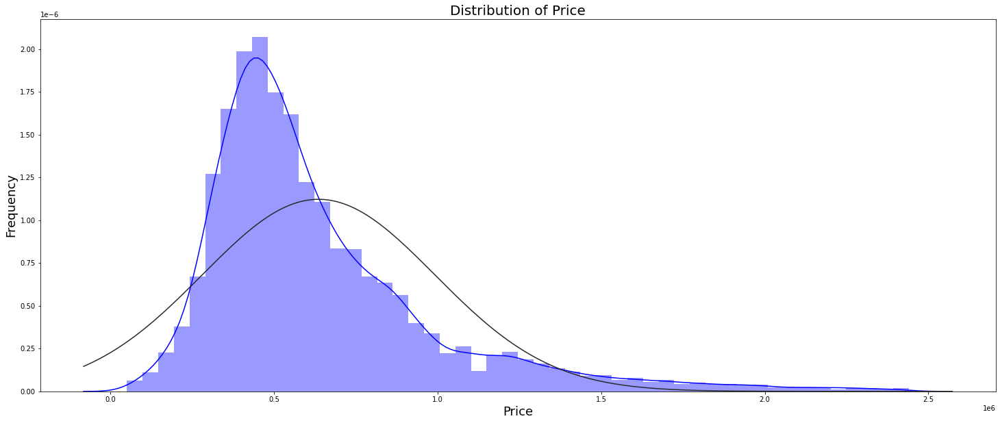

In [43]:
#graph and see the distribution of price
plt.figure(figsize=(25, 10))
sns.distplot(df2['price'], color='blue',fit=norm)
plt.title('Distribution of Price', fontsize=20)
plt.xlabel('Price', fontsize=18)
plt.ylabel('Frequency', fontsize=18)

In [44]:
#normality test
from scipy.stats import shapiro
stat, p = shapiro(df2['price'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.846, p=0.000
Sample does not look Gaussian (reject H0)


**Pipeline for Machine Learning models**

In [45]:
corr_matrix = df2.corr()
corr_matrix['price'].sort_values(ascending=False).round(1)

price               1.0
floor_area          0.5
other_room_area     0.5
bathroom_area       0.4
garage_area         0.4
bathrooms           0.4
bedroom_area        0.3
bedrooms            0.3
garage              0.1
year_sold           0.1
land_area           0.1
free_area           0.1
suburb              0.0
month_sold          0.0
nearest_stn         0.0
nearest_sch        -0.0
nearest_sch_dist   -0.0
nearest_stn_dist   -0.1
build_year         -0.2
postcode           -0.2
cbd_dist           -0.4
Name: price, dtype: float64

In [46]:
#import all the models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from mlxtend.regressor import StackingCVRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [47]:

#split the data into train and test
X = df2.drop('price', axis=1)
y = df2['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [48]:
# Initialize models
lr = LinearRegression()
lasso = Lasso(alpha=0.1)
enet = ElasticNet(alpha=0.1, l1_ratio=0.5)#The L1 ratio controls the balance between L1 and L2 regularization, with a ratio of 1.0 indicating pure L1 regularization and a ratio of 0.0 indicating pure L2 regularization.
dt = DecisionTreeRegressor(random_state=42)
rf = RandomForestRegressor(random_state=42)
knn = KNeighborsRegressor()
xgb = XGBRegressor()
gb = GradientBoostingRegressor()
stack = StackingCVRegressor(regressors=(lr, lasso, enet, dt, rf, knn, xgb, gb), meta_regressor=lr, use_features_in_secondary=True)



# Train models
lr.fit(X_train, y_train)
lasso.fit(X_train, y_train)
enet.fit(X_train, y_train)
dt.fit(X_train, y_train)
rf.fit(X_train, y_train)
knn.fit(X_train, y_train)
xgb.fit(X_train, y_train)
gb.fit(X_train, y_train)
stack.fit(X_train, y_train)

# Make predictions
lr_pred = lr.predict(X_test)
lasso_pred = lasso.predict(X_test)
y_pred_enet = enet.predict(X_test)
dt_pred = dt.predict(X_test).round(2)
rf_pred = rf.predict(X_test).round(2)
knn_pred = knn.predict(X_test).round(2)
xgb_pred = xgb.predict(X_test).round(2)
gb_pred = gb.predict(X_test).round(2)
stack_pred = stack.predict(X_test).round(2)


# Evaluate models
print("Linear Regression RMSE: ", np.sqrt(mean_squared_error(y_test, lr_pred)))
print("Linear Regression R^2 Score: ", r2_score(y_test, lr_pred))
print("Lasso RMSE: ", np.sqrt(mean_squared_error(y_test, lasso_pred)))
print("Lasso R^2 Score: ", r2_score(y_test, lasso_pred))
print("Elastic Net RMSE: ", np.sqrt(mean_squared_error(y_test, y_pred_enet)))
print("Elastic Net R^2 Score: ", r2_score(y_test, y_pred_enet))
print("Decision Tree RMSE: ", np.sqrt(mean_squared_error(y_test, dt_pred)))
print("Decision Tree R^2 Score: ", r2_score(y_test, dt_pred))
print("Random Forest RMSE: ", np.sqrt(mean_squared_error(y_test, rf_pred)))
print("KNN RMSE: ", np.sqrt(mean_squared_error(y_test, knn_pred)))
print("KNN R^2 Score: ", r2_score(y_test, knn_pred))
print("XGB RMSE: ", np.sqrt(mean_squared_error(y_test, xgb_pred)))
print("XGB R^2 Score: ", r2_score(y_test, xgb_pred))
print("Gradient Boosting RMSE: ", np.sqrt(mean_squared_error(y_test, gb_pred)))
print("Gradient Boosting R^2 Score: ", r2_score(y_test, gb_pred))
print("Stacking RMSE: ", np.sqrt(mean_squared_error(y_test, stack_pred)))
print("Stacking R^2 Score: ", r2_score(y_test, stack_pred))

Linear Regression RMSE:  248356.9404154706
Linear Regression R^2 Score:  0.49734160486826506
Lasso RMSE:  248356.90594606436
Lasso R^2 Score:  0.4973417443959559
Elastic Net RMSE:  248199.58707934836
Elastic Net R^2 Score:  0.497978349054906
Decision Tree RMSE:  206919.10184598662
Decision Tree R^2 Score:  0.651083499847801
Random Forest RMSE:  147935.58834839074
KNN RMSE:  202263.50501029997
KNN R^2 Score:  0.6666078299032423
XGB RMSE:  145939.8309117983
XGB R^2 Score:  0.8264326567931164
Gradient Boosting RMSE:  168045.57402775763
Gradient Boosting R^2 Score:  0.7698693334370396
Stacking RMSE:  141780.04361760165
Stacking R^2 Score:  0.8361861755748807


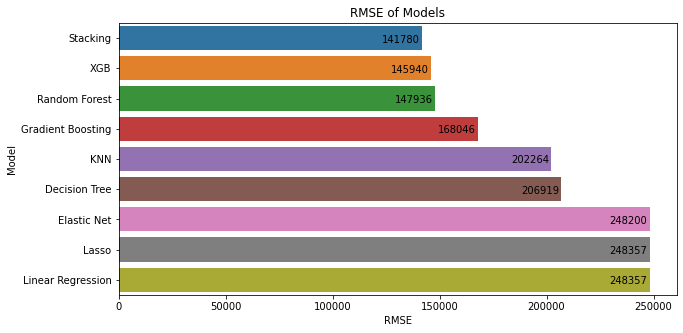

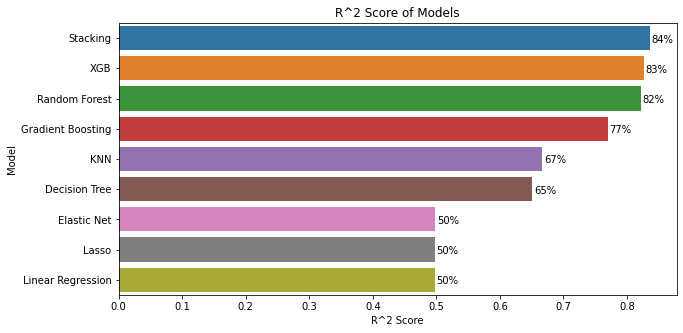

In [82]:
#sort the models by their RMSE
models_RMSE = pd.DataFrame({
    'Model': ['Linear Regression', 'Lasso', 'Elastic Net', 'Decision Tree', 'Random Forest', 'KNN', 'XGB', 'Gradient Boosting', 'Stacking'],
    'RMSE': [np.sqrt(mean_squared_error(y_test, lr_pred)), np.sqrt(mean_squared_error(y_test, lasso_pred)), np.sqrt(mean_squared_error(y_test, y_pred_enet)), np.sqrt(mean_squared_error(y_test, dt_pred)), np.sqrt(mean_squared_error(y_test, rf_pred)), np.sqrt(mean_squared_error(y_test, knn_pred)), np.sqrt(mean_squared_error(y_test, xgb_pred)), np.sqrt(mean_squared_error(y_test, gb_pred)), np.sqrt(mean_squared_error(y_test, stack_pred))]})
models_RMSE.sort_values(by='RMSE', ascending=True)

#sort the models by their R^2 score
models_R2 = pd.DataFrame({
    'Model': ['Linear Regression', 'Lasso', 'Elastic Net', 'Decision Tree', 'Random Forest', 'KNN', 'XGB', 'Gradient Boosting', 'Stacking'],
    'R^2 Score': [r2_score(y_test, lr_pred), r2_score(y_test, lasso_pred), r2_score(y_test, y_pred_enet), r2_score(y_test, dt_pred), r2_score(y_test, rf_pred), r2_score(y_test, knn_pred), r2_score(y_test, xgb_pred), r2_score(y_test, gb_pred), r2_score(y_test, stack_pred)]})
models_R2.sort_values(by='R^2 Score', ascending=False)


#label bar chart with RMSE

fig, ax = plt.subplots(figsize=(10, 5))

sns.barplot(x='RMSE', y='Model', data=models_RMSE.sort_values(by='RMSE', ascending=True), ax=ax)
ax.set_title('RMSE of Models')
ax.set_xlabel('RMSE')
ax.set_ylabel('Model')

for p in ax.patches:
    width = p.get_width()
    plt.text(-10000+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:1.0f}'.format(width),
             ha='center', va='center')
    
plt.show()

#label bar chart with R^2 Score in percentage

fig, ax = plt.subplots(figsize=(10, 5))

sns.barplot(x='R^2 Score', y='Model', data=models_R2.sort_values(by='R^2 Score', ascending=False), ax=ax)
ax.set_title('R^2 Score of Models')

for p in ax.patches:
    width = p.get_width()
    plt.text(0.02+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:1.0%}'.format(width),
             ha='center', va='center')
    
plt.show()




In [98]:
#compare actual price and predicted price
df3 = pd.DataFrame({'Actual': y_test, 'Predicted': stack_pred})
#difference between actual and predicted price

df3['Difference'] = df3['Actual'] - df3['Predicted']
df3['Difference'] = df3['Difference'].abs()
df3['Difference'] = df3['Difference'].round(2)
df3['Difference'] = df3['Difference'].astype(int)

#sort the dataframe by difference
df3 = df3.sort_values(by='Difference', ascending=True)


df3.head(20)


,Actual,Predicted,Difference
1927,485000,485019.22,19
28031,248000,247955.86,44
13101,360000,360071.78,71
14912,770000,769873.55,126
13800,420000,419871.37,128
18032,470000,470145.06,145
30739,145000,144850.28,149
1293,380000,379841.99,158
7905,445000,445163.59,163
2349,330000,330167.86,167


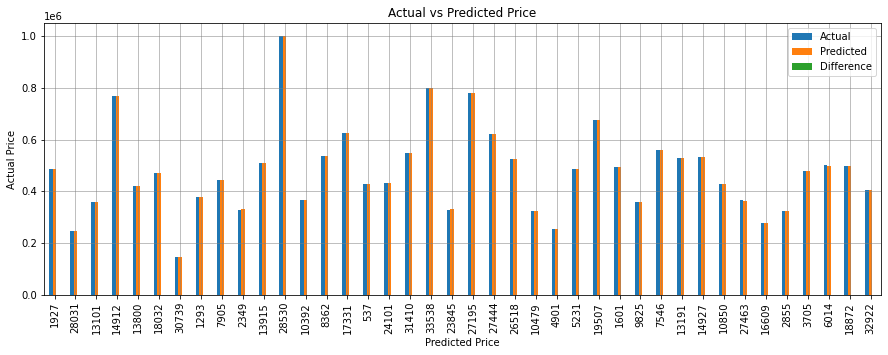

In [107]:
#title the graph
plot = df3.head(40).plot(kind='bar', figsize=(15, 5))
#barsize



#label the graph
plt.title('Actual vs Predicted Price')
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')

plt.grid(which='major', linestyle='-', linewidth='0.5', color='gray')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')



plt.show()
